Bioinformatics Analysis of Post-natal Day 4 mice lung samples
S7+S8
S9+S10 
Created by : Sayane Shome
Date of updated version : April 13,2022
Content :
1.Clustering of data
2.Carrying out DE analysis
3.Subsetting macrophage clusters
4.Computing RNA velocity of macrophage clusters

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scvelo as scv

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.20.3 scipy==1.7.1 pandas==1.3.4 scikit-learn==0.24.2 statsmodels==0.12.2 python-igraph==0.9.11 louvain==0.7.1 pynndescent==0.5.6


In [3]:
S7 = sc.read_10x_mtx('S7/filtered_feature_bc_matrix/',cache=True)  
S8 = sc.read_10x_mtx('S8/filtered_feature_bc_matrix/',cache=True)
S9 = sc.read_10x_mtx('S9/filtered_feature_bc_matrix/',cache=True)
S10 = sc.read_10x_mtx('S10/filtered_feature_bc_matrix/',cache=True)

... reading from cache file cache/S7-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/S8-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/S9-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/S10-filtered_feature_bc_matrix-matrix.h5ad


In [4]:
S7.obs['sample'] = 'Cre-'
S8.obs['sample'] = 'Cre-'
S9.obs['sample'] = 'Cre+'
S10.obs['sample'] = 'Cre+'

In [5]:
S7.var_names_make_unique()
S8.var_names_make_unique()
S9.var_names_make_unique()
S10.var_names_make_unique()

In [6]:
S7_loom = scv.read('S7/velocyto/possorted_genome_bam_C41I3.loom', cache=True)
S8_loom = scv.read('S8/velocyto/possorted_genome_bam_311AB.loom', cache=True)
S9_loom = scv.read('S9/velocyto/possorted_genome_bam_O24Y3.loom', cache=True)
S10_loom = scv.read('S10/velocyto/possorted_genome_bam_4HZE9.loom', cache=True)

... reading from cache file cache/S7-velocyto-possorted_genome_bam_C41I3.h5ad
... reading from cache file cache/S8-velocyto-possorted_genome_bam_311AB.h5ad
... reading from cache file cache/S9-velocyto-possorted_genome_bam_O24Y3.h5ad
... reading from cache file cache/S10-velocyto-possorted_genome_bam_4HZE9.h5ad


In [7]:
S7_1 = scv.utils.merge(S7,S7_loom)
S7 = S7_1
S8_1 = scv.utils.merge(S8,S8_loom)
S8 = S8_1
S9_1 = scv.utils.merge(S9,S9_loom)
S9 = S9_1
S10_1 = scv.utils.merge(S10,S10_loom)
S10 = S10_1


normalizing counts per cell
    finished (0:00:00)


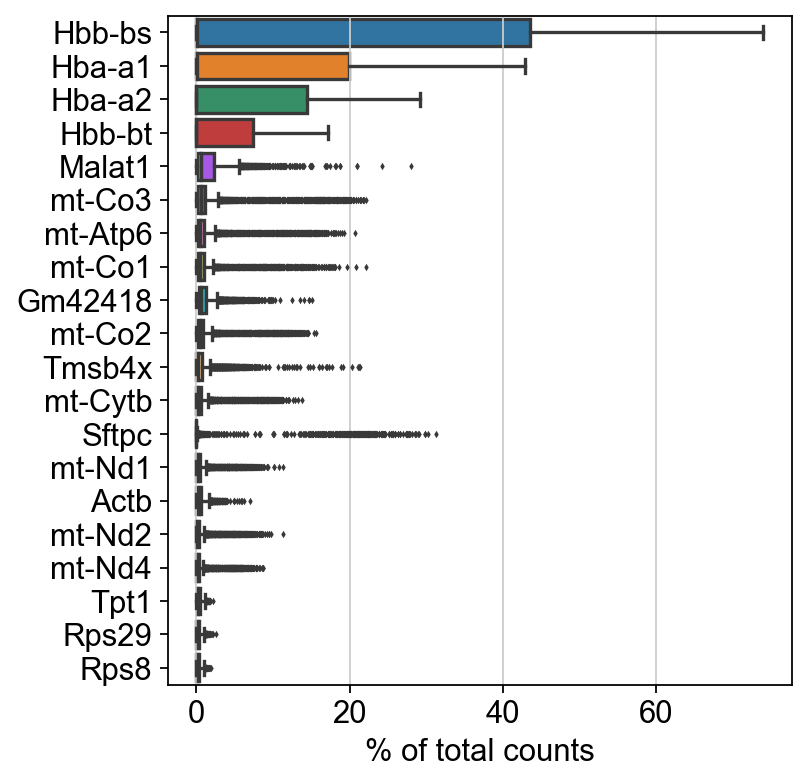

normalizing counts per cell
    finished (0:00:00)


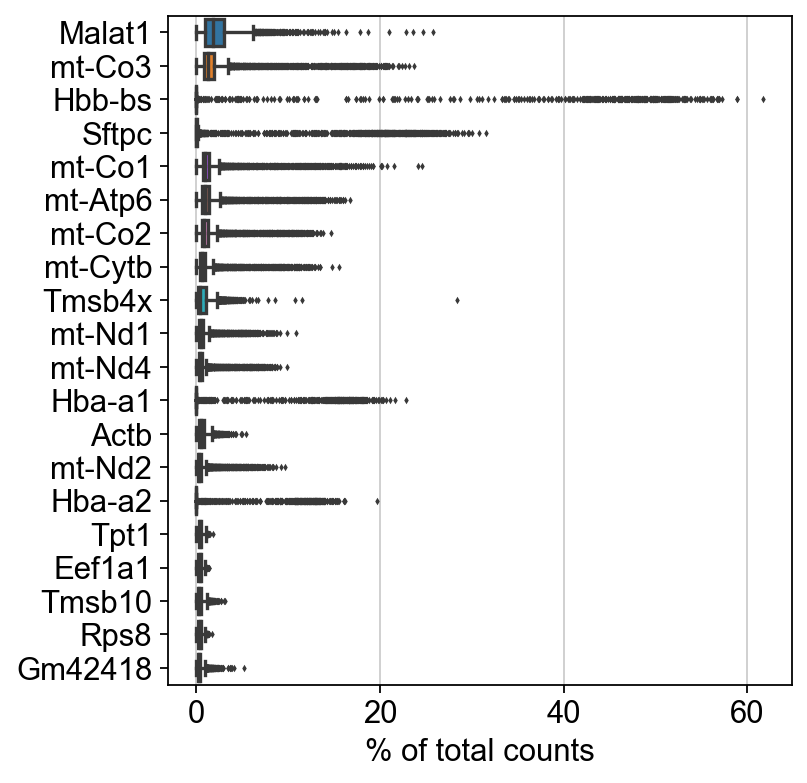

normalizing counts per cell
    finished (0:00:00)


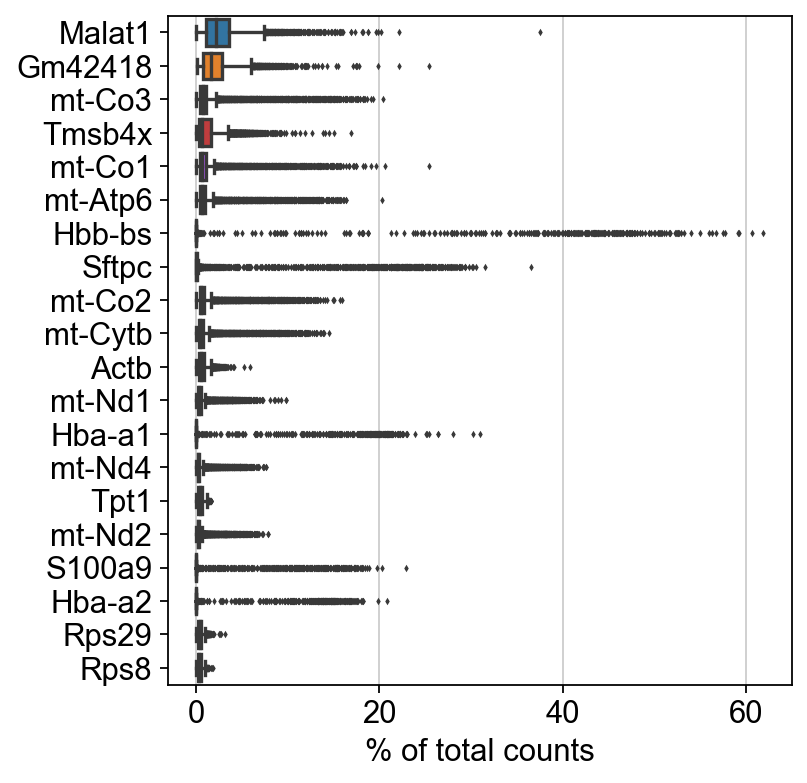

normalizing counts per cell
    finished (0:00:00)


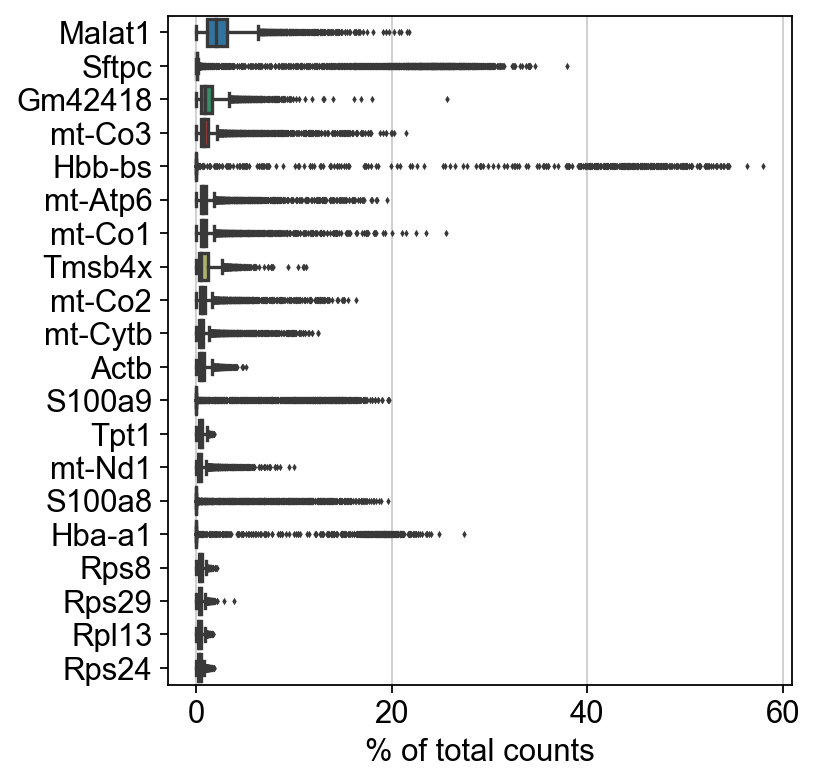

In [8]:
sc.pl.highest_expr_genes(S7, n_top=20, )
sc.pl.highest_expr_genes(S8, n_top=20, )
sc.pl.highest_expr_genes(S9, n_top=20, )
sc.pl.highest_expr_genes(S10, n_top=20, )

In [9]:
sc.pp.filter_cells(S7, min_genes=200)
sc.pp.filter_genes(S7, min_cells=3)
sc.pp.filter_cells(S8, min_genes=200)
sc.pp.filter_genes(S8, min_cells=3)
sc.pp.filter_cells(S9, min_genes=200)
sc.pp.filter_genes(S9, min_cells=3)
sc.pp.filter_cells(S10, min_genes=200)
sc.pp.filter_genes(S10, min_cells=3)

filtered out 2900 cells that have less than 200 genes expressed
filtered out 13159 genes that are detected in less than 3 cells
filtered out 385 cells that have less than 200 genes expressed
filtered out 12845 genes that are detected in less than 3 cells
filtered out 260 cells that have less than 200 genes expressed
filtered out 12304 genes that are detected in less than 3 cells
filtered out 289 cells that have less than 200 genes expressed
filtered out 12067 genes that are detected in less than 3 cells


In [10]:
adata = S7.concatenate(S8,S9,S10)

In [11]:
print(adata.obs['sample'].value_counts())

Cre+    20521
Cre-    14336
Name: sample, dtype: int64


In [12]:
# mitochondrial genes
adata.var['mt'] = adata.var_names.str.startswith('mt-') 
# ribosomal genes
adata.var['ribo'] = adata.var_names.str.startswith(("Rps","Rpl"))
# hemoglobin genes.
adata.var['hb'] = adata.var_names.str.contains(("^Hb[^(p)]"))

adata.var

,gene_ids,feature_types,Accession,End,Start,Strand,Chromosome-0,n_cells-0,Chromosome-1,n_cells-1,Chromosome-2,n_cells-2,Chromosome-3,n_cells-3,mt,ribo,hb
Xkr4,ENSMUSG00000051951,Gene Expression,ENSMUSG00000051951,3671498,3205901,-,1,40,1,53,1,47,1,81,False,False,False
Gm19938,ENSMUSG00000102331,Gene Expression,ENSMUSG00000102331,3658904,3647309,-,1,83,1,126,1,70,1,77,False,False,False
Rp1,ENSMUSG00000025900,Gene Expression,ENSMUSG00000025900,4409241,3999557,-,1,37,1,32,1,56,1,63,False,False,False
Sox17,ENSMUSG00000025902,Gene Expression,ENSMUSG00000025902,4497354,4490931,-,1,1471,1,1408,1,1804,1,2236,False,False,False
Gm37587,ENSMUSG00000104238,Gene Expression,ENSMUSG00000104238,4499558,4496551,+,1,69,1,57,1,61,1,67,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Vamp7,ENSMUSG00000051412,Gene Expression,ENSMUSG00000051412,39148,10738,-,GL456233.1,919,GL456233.1,1395,GL456233.1,1351,GL456233.1,1940,False,False,False
Spry3,ENSMUSG00000061654,Gene Expression,ENSMUSG00000061654,106395,101352,-,GL456233.1,7,GL456233.1,14,GL456233.1,10,GL456233.1,7,False,False,False
Tmlhe,ENSMUSG00000079834,Gene Expression,ENSMUSG00000079834,334183,159647,+,GL456233.1,144,GL456233.1,104,GL456233.1,200,GL456233.1,219,False,False,False
CAAA01147332.1,ENSMUSG00000095742,Gene Expression,ENSMUSG00000095742,1479,66,-,JH584295.1,279,JH584295.1,411,JH584295.1,610,JH584295.1,487,False,False,False


In [13]:
sc.pp.calculate_qc_metrics(adata,qc_vars=['mt','ribo','hb'],percent_top=None,log1p=False,inplace=True)

In [14]:
mito_genes = adata.var_names.str.startswith('mt-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata.obs['percent_mt2'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

normalizing counts per cell
    finished (0:00:00)


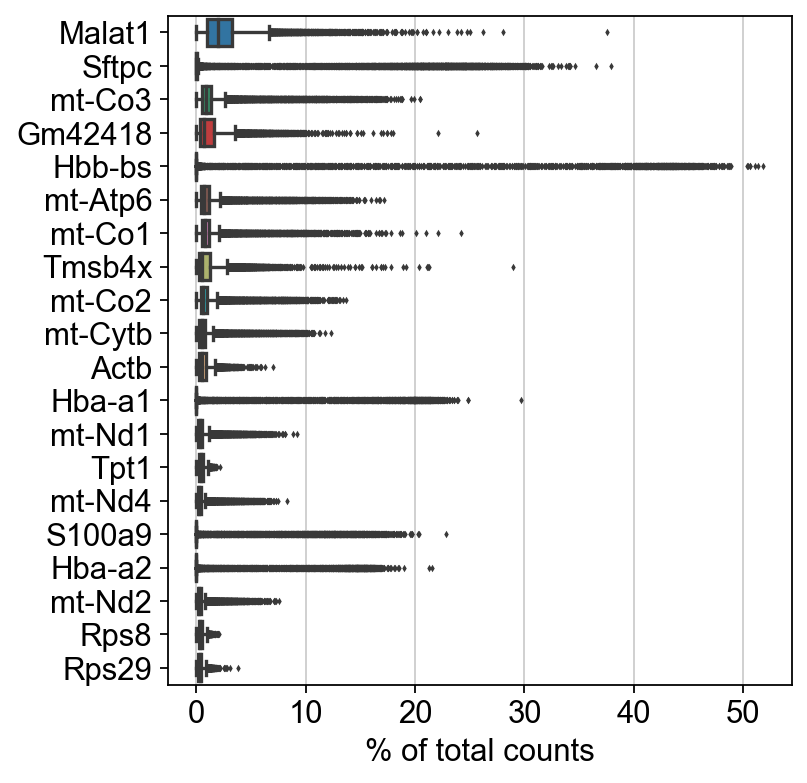

In [15]:
sc.pl.highest_expr_genes(adata, n_top=20, )

In [16]:
# filter for percent mito
adata = adata[adata.obs['pct_counts_mt'] < 16, :]

# filter for percent hb > 5
adata = adata[adata.obs['pct_counts_hb'] < 5, :]

# filter for percent ribo > 15
adata = adata[adata.obs['pct_counts_ribo'] > 15, :]

print("Remaining cells %d"%adata.n_obs)

Remaining cells 17157


normalizing counts per cell
    finished (0:00:00)


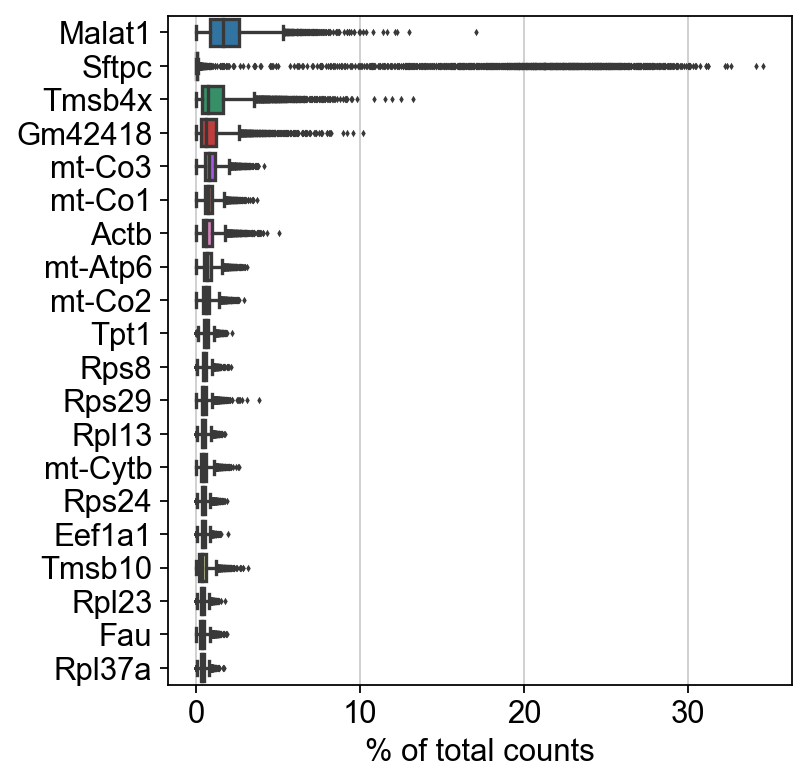

In [17]:
sc.pl.highest_expr_genes(adata, n_top=20, )

In [18]:
malat1 = adata.var_names.str.startswith('Malat1')
# we need to redefine the mito_genes since they were first 
# calculated on the full object before removing low expressed genes.
mito_genes = adata.var_names.str.startswith('mt-')
hb_genes = adata.var_names.str.contains(("^Hb[^(p)]"))
rb_genes = adata.var_names.str.startswith(("Rps","Rpl"))


remove = np.add(mito_genes,malat1)
remove1 = np.add(remove,hb_genes)
remove2 = np.add(remove1,rb_genes)
keep = np.invert(remove2)

adata = adata[:,keep]

print(adata.n_obs, adata.n_vars)

17157 18164


normalizing counts per cell
    finished (0:00:00)


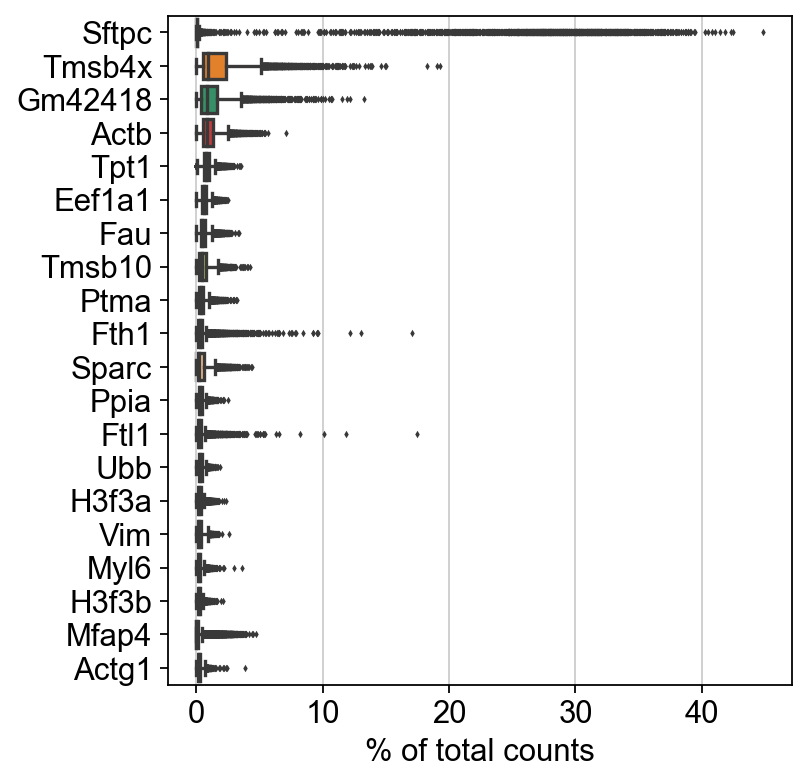

In [19]:
sc.pl.highest_expr_genes(adata, n_top=20, )

In [20]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

print(adata.n_obs, adata.n_vars)

filtered out 5 genes that are detected in less than 3 cells
17157 18159


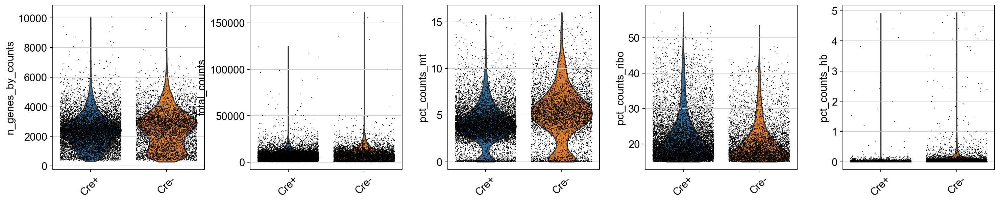

In [21]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, groupby = 'sample', rotation= 45)

normalizing counts per cell
    finished (0:00:00)


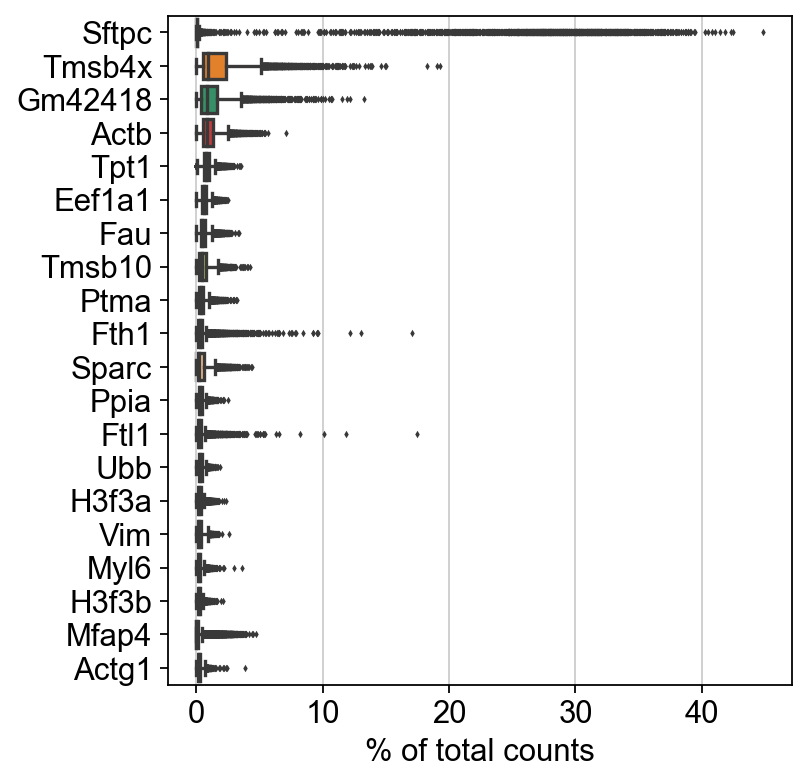

In [22]:
sc.pl.highest_expr_genes(adata, n_top=20, )

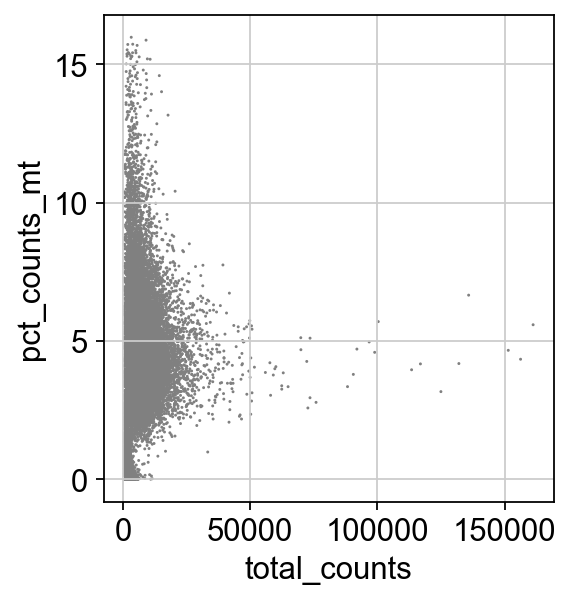

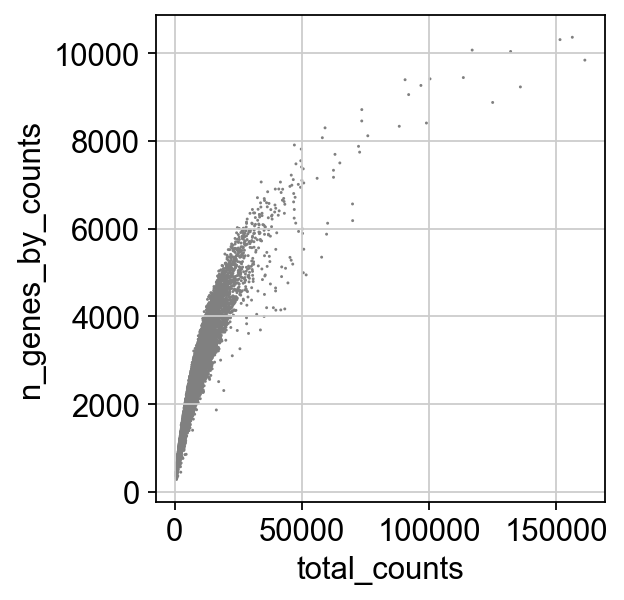

In [23]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [24]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


In [25]:
sc.pp.log1p(adata)

In [26]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


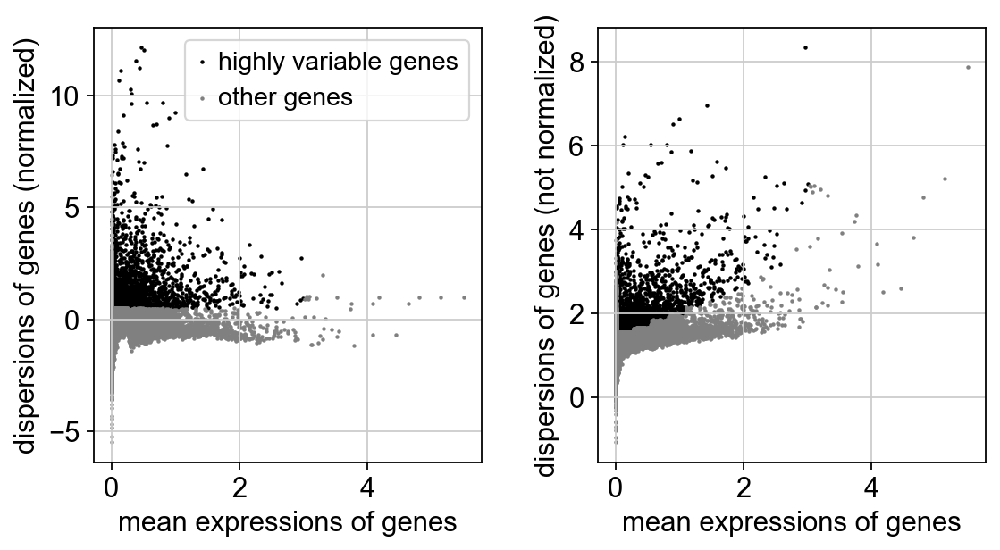

In [27]:
sc.pl.highly_variable_genes(adata)

In [28]:
adata.raw = adata

In [29]:
adata = adata[:, adata.var.highly_variable]

In [30]:
sc.pp.scale(adata, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [31]:
adata

AnnData object with n_obs × n_vars = 17157 × 2789
    obs: 'sample', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_genes', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts'
    var: 'gene_ids', 'feature_types', 'Accession', 'End', 'Start', 'Strand', 'Chromosome-0', 'n_cells-0', 'Chromosome-1', 'n_cells-1', 'Chromosome-2', 'n_cells-2', 'Chromosome-3', 'n_cells-3', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'sample_colors', 'log1p', 'hvg'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

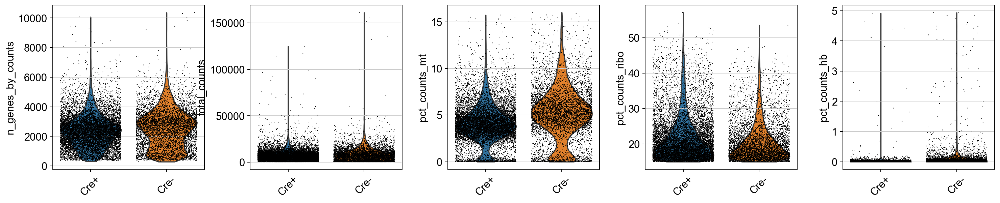

In [32]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, groupby = 'sample', rotation= 45)

In [33]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


In [34]:
print(adata.obs['sample'].value_counts())

Cre+    11192
Cre-     5965
Name: sample, dtype: int64


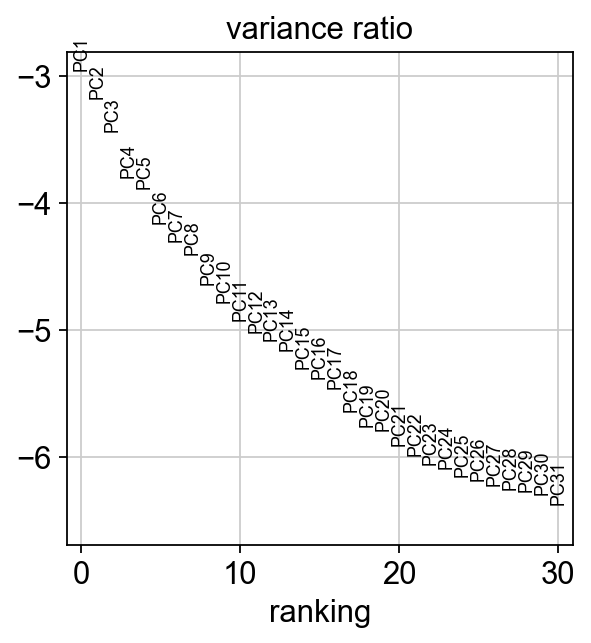

In [35]:
sc.pl.pca_variance_ratio(adata, log=True)

In [36]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40


OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:06)


In [37]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)


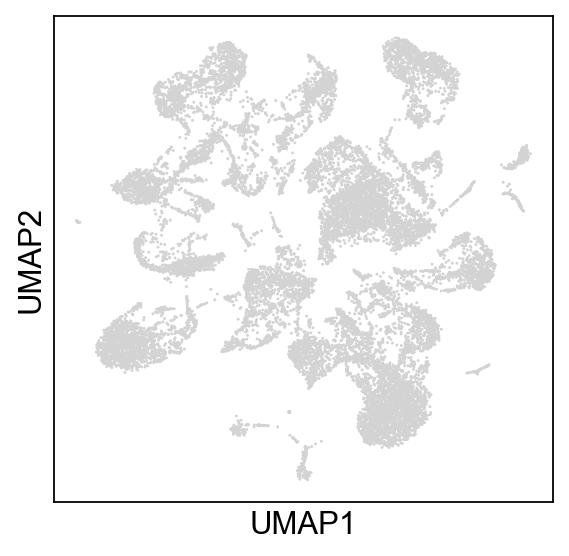

In [38]:
sc.pl.umap(adata)

In [39]:
sc.tl.leiden(adata, key_added = "leiden_10") # default resolution in 1.0
sc.tl.leiden(adata, resolution = 0.3, key_added = "leiden_03")
sc.tl.leiden(adata, resolution = 0.2, key_added = "leiden_02")
sc.tl.leiden(adata, resolution = 0.1, key_added = "leiden_01")
sc.tl.leiden(adata, resolution = 0.01, key_added = "leiden_001")

#have labelled the leiden clustering without the decimal points for easier code-writing

running Leiden clustering
    finished: found 49 clusters and added
    'leiden_10', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 27 clusters and added
    'leiden_03', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden_02', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden_01', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden_001', the cluster labels (adata.obs, categorical) (0:00:00)


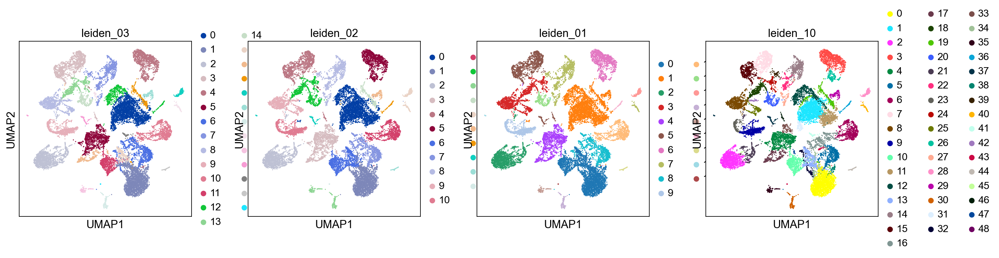

In [40]:
sc.pl.umap(adata, color=['leiden_03','leiden_02', 'leiden_01','leiden_10'])

In [41]:
import numpy as np
import pandas as pd
import scanpy as sc
import gseapy
import matplotlib.pyplot as plt

sc.settings.verbosity = 2             # verbosity: errors (0), warnings (1), info (2), hints (3)
#sc.logging.print_versions()

In [42]:
sc.settings.set_figure_params(dpi=80)

In [43]:
adata = adata[:, adata.var.highly_variable]

In [44]:
print(adata.X.shape)
print(adata.raw.X.shape)

#shows the filtered and raw version of the data

(17157, 2789)
(17157, 18159)


In [45]:
adata

View of AnnData object with n_obs × n_vars = 17157 × 2789
    obs: 'sample', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_genes', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'leiden_10', 'leiden_03', 'leiden_02', 'leiden_01', 'leiden_001'
    var: 'gene_ids', 'feature_types', 'Accession', 'End', 'Start', 'Strand', 'Chromosome-0', 'n_cells-0', 'Chromosome-1', 'n_cells-1', 'Chromosome-2', 'n_cells-2', 'Chromosome-3', 'n_cells-3', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'sample_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_03_colors', 'leiden_02_colors', 'leiden_01_colors', 'leiden_10_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'am

In [46]:
#adata.write_h5ad('adata_afterleidenclustering_feb28_2022.h5ad')

In [47]:
sc.tl.dendrogram(adata,'sample')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_sample']`


ranking genes
    finished (0:00:18)


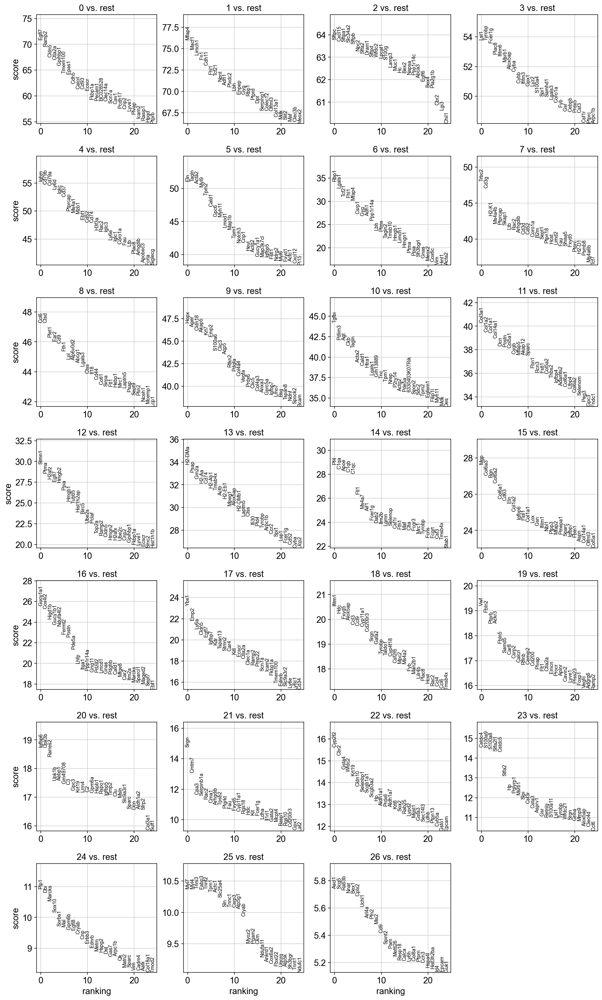

In [48]:
sc.tl.rank_genes_groups(adata,'leiden_03', method='wilcoxon', key_added = "wilcoxon",group = "sample")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key="wilcoxon")

categories: Cre+, Cre-
var_group_labels: 0, 1, 2, etc.


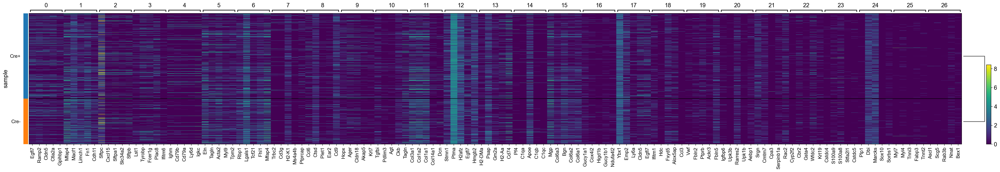

In [49]:
sc.pl.rank_genes_groups_heatmap(adata, n_genes=5, key="wilcoxon", groupby="sample", show_gene_labels=True)

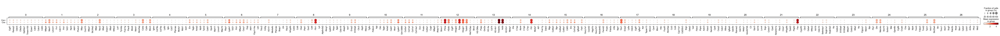

In [50]:
sc.pl.rank_genes_groups_dotplot(adata,n_genes=10,key="wilcoxon",groupby="sample")

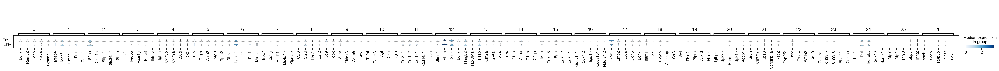

In [51]:
sc.pl.rank_genes_groups_stacked_violin(adata, n_genes=5, key="wilcoxon", groupby="sample")

ranking genes
    finished (0:00:13)


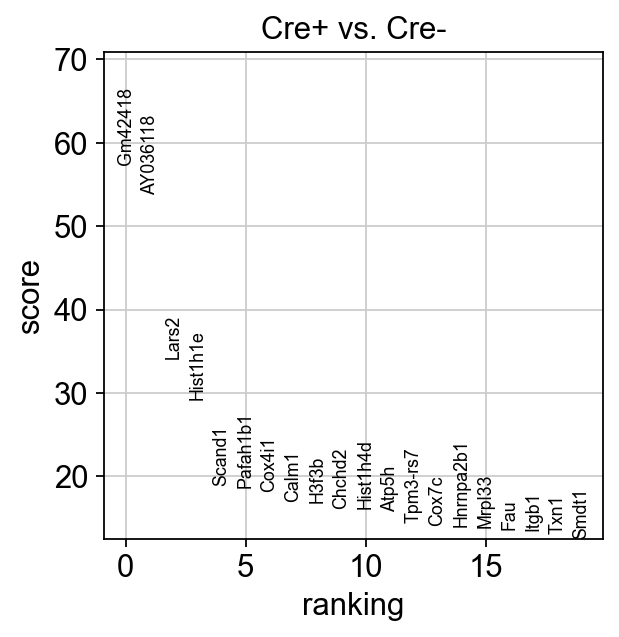

In [52]:
sc.tl.rank_genes_groups(adata, 'sample', groups=['Cre+'], reference='Cre-', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['Cre+'], n_genes=20)

ranking genes
    finished (0:00:13)


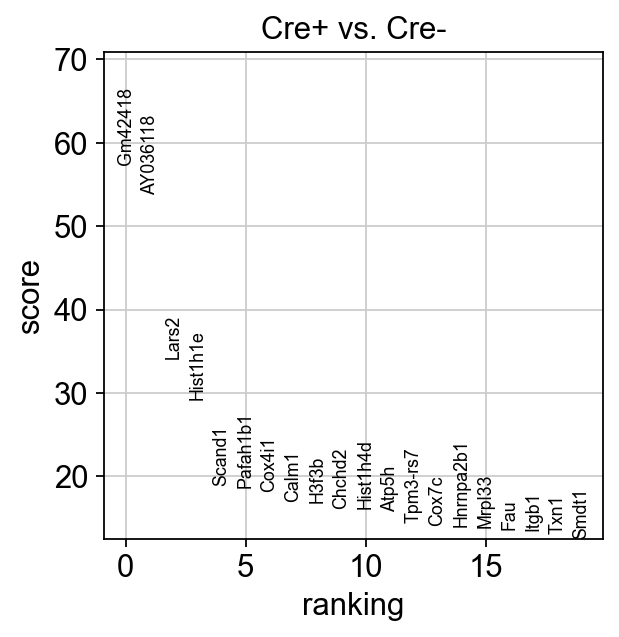

In [53]:
sc.tl.rank_genes_groups(adata,'sample', groups=['Cre+'], reference='Cre-', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['Cre+'], n_genes=20)

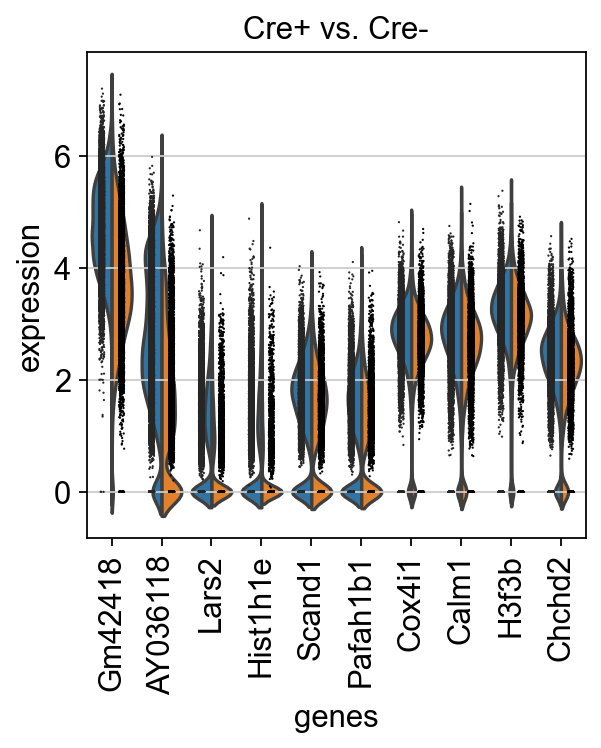

In [54]:
sc.pl.rank_genes_groups_violin(adata,groups='Cre+', n_genes=10)

In [55]:
sc.tl.rank_genes_groups(adata,'sample', method='wilcoxon')

# The head function returns the top n genes per cluster
top_markers = pd.DataFrame(adata.uns['rank_genes_groups']['names'])
print(top_markers)

ranking genes
    finished (0:00:13)
           Cre+      Cre-
0       Gm42418      Eef2
1      AY036118     Uba52
2         Lars2    Eef1a1
3      Hist1h1e      Ptms
4        Scand1      Calr
...         ...       ...
18154      Calr    Scand1
18155      Ptms  Hist1h1e
18156    Eef1a1     Lars2
18157     Uba52  AY036118
18158      Eef2   Gm42418

[18159 rows x 2 columns]


In [56]:
#adata.write('adata_after_diffexp.h5ad')
#adata = sc.read('adata_after_diffexp.h5ad')

In [57]:
sc.tl.rank_genes_groups(adata,'sample', method='wilcoxon')

ranking genes
    finished (0:00:13)


In [58]:
sc.tl.rank_genes_groups(adata,'leiden_02', method='wilcoxon')

ranking genes
    finished (0:00:17)


In [59]:
top_markers = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(25)
print(top_markers)

           0         1         2         3        4        5        6  \
0      Egfl7     Mfap4     Sftpc      Myl9     Lst1     Ighm   Col1a2   
1      Ramp2     Macf1    Cxcl15     Tagln   Tyrobp    Cd79b   Col1a1   
2      Cldn5    Limch1    Sftpa1     Cald1   Fcer1g    Cd79a   Col3a1   
3     Ctla2a       Fn1   Slc34a2     Acta2    Plac8     Ly6d  Col14a1   
4    Gpihbp1     Cdh11     Sftpb      Tpm2   Ifitm6     Igkc    Sparc   
5      Epas1      Npnt      Npc2   Gucy1a1    Msrb1     Cd37   Col6a2   
6    Tmem100      Fhl1     Sfta2     Myh11  Alox5ap  Ptprcap   Col5a1   
7       Cdh5     Tcf21     Dram1    Notch3     Cyba    Ms4a1    Mfap5   
8      Ecscr      Adh1     Sftpd       Eln     Cybb     Mzb1   Col6a1   
9       Cd93     Enpep     Wfdc2     Postn   Ifitm3     Ebf1    Fstl1   
10    Calcrl       Gyg    Lpcat1      Heyl     Lyz2     Cd52     Rcn3   
11    Fkbp1a       Lbh     S100g      Lhfp     Gpx1     Cd74      Bgn   
12  BC028528    Plxdc2     Lamp3    Pdgfrb   S100a4

In [60]:
top_markers.to_csv('leiden_03.csv',index=False)

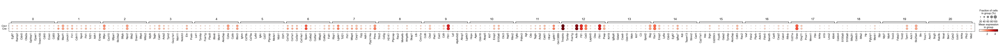

In [61]:
sc.pl.rank_genes_groups_dotplot(adata,n_genes=10,groupby="sample")

In [62]:
cluster2annotation = {
     '0': 'Endothelial cell',
     '1': 'Stromal Cell',
     '2': 'Alveolar Cell',
     '3': 'Macrophage/Neutrophil',
     '4': 'B-cell',
     '5': 'Stromal Cell',
     '6': 'Smooth muscle cell/Stromal Cell',
     '7': 'Stromal Cell',
     '8': 'T-cell',
    '9': 'Macrophages',
     '10': 'Alveolar Cells',
     '11': 'Smooth muscle cell',
     '12': 'Neuronal Cell',
     '13': 'Dendritic Cell',
     '14': 'Macrophages',
     '15': 'Smooth muscle cell',
     '16': 'Endothelial cell',
     '17': 'Macrophages',
      '18': 'Endothelial cell',
     '19': 'Stromal Cell',
     '20': 'Neutrophil',
     '21': 'Lung Clara cell',
     '22': 'Neutrophil',
     '23': 'Oligodendrocyte',
     '24': 'Cardiomyocyte',
     '25': 'Not decided'
}

#Created a list of manually annotated clusters and assignments done;can be used if required.

In [63]:
#adata.obs['celltype'] = adata.obs['leiden_03'].map(cluster2annotation).astype('category')
#uncomment the previous code line to assign the clusters

In [64]:
#sc.pl.umap(adata, color='cell type', legend_loc='on data',frameon=False, legend_fontsize=4, legend_fontoutline=2)
#uncomment the previous code line to create umap with this annotations

In [65]:
cluster2annotation1 = {
     '0': '',
     '1': '',
     '2': '',
     '3': 'Macrophages',
     '4': '',
     '5': '',
     '6': '',
     '7': '',
     '8': '',
    '9': 'Macrophages',
     '10': '',
     '11': '',
     '12': '',
     '13': 'Macrophages',
     '14': 'Macrophages',
     '15': '',
     '16': '',
     '17': '',
      '18': '',
     '19': '',
     '20': '',
     '21': '',
     '22': 'Macrophages',
     '23': '',
     '24': '',
     '25': ''
}

In [66]:
adata.obs['cell type_v2'] = adata.obs['leiden_03'].map(cluster2annotation1).astype('category')

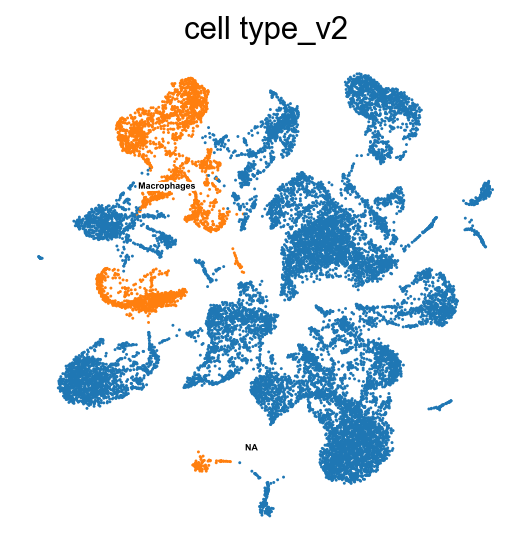

In [67]:
sc.pl.umap(adata, color='cell type_v2', legend_loc='on data',frameon=False, legend_fontsize=4, legend_fontoutline=2)

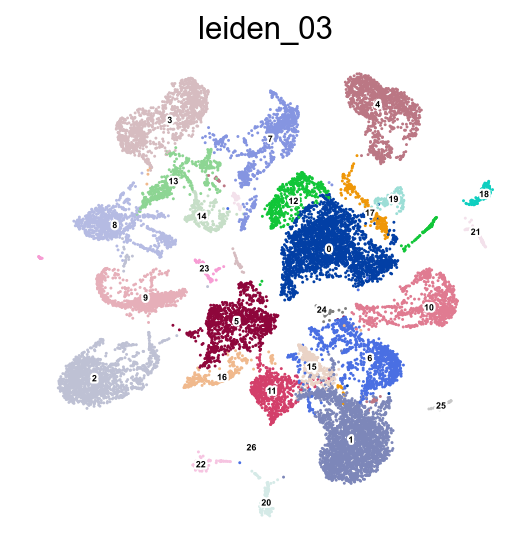

In [68]:
sc.pl.umap(adata, color='leiden_03', legend_loc='on data',frameon=False, legend_fontsize=4, legend_fontoutline=2)

In [69]:
sc.tl.rank_genes_groups(adata, groupby='cell type_v2', method='wilcoxon')

ranking genes
    finished (0:00:13)


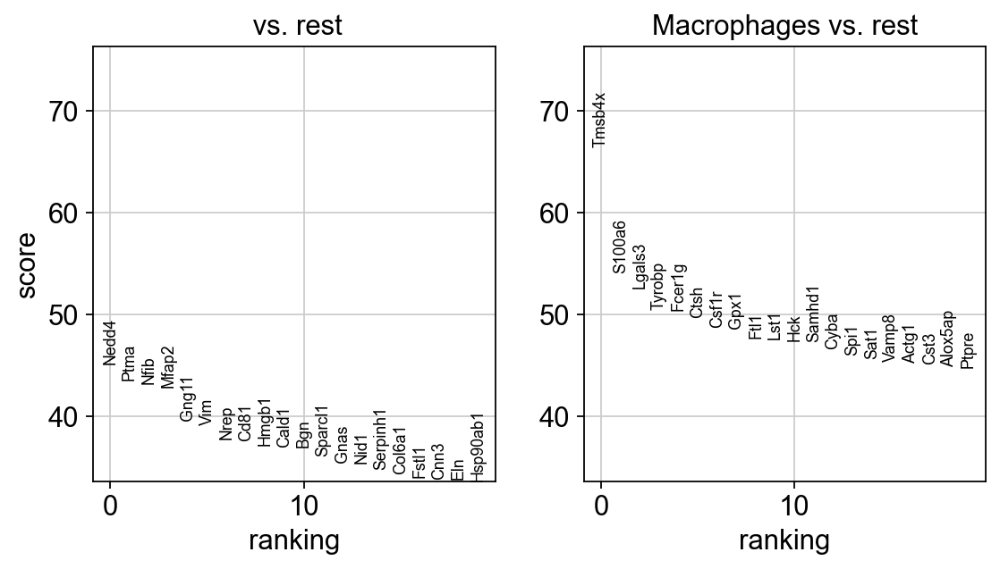

In [70]:
sc.pl.rank_genes_groups(adata)

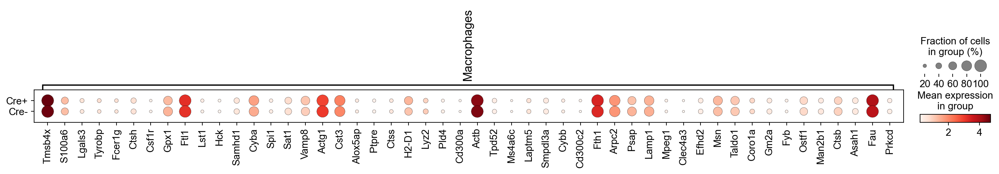

In [71]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=50, groups=['Macrophages'],groupby = 'sample')

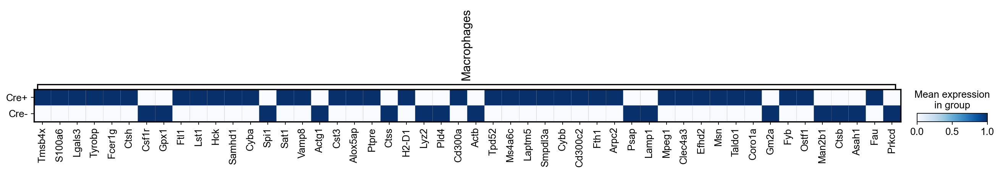

In [72]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=50, groups=['Macrophages'],groupby = 'sample',standard_scale='var', cmap='Blues')


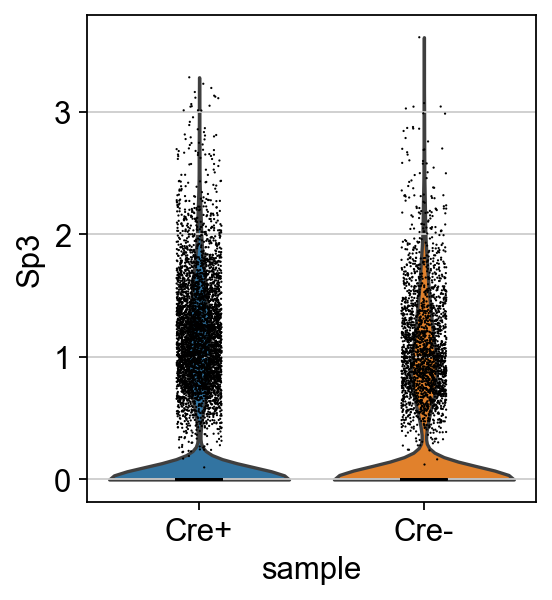

In [73]:
sc.pl.violin(adata,['Sp3'], groupby='sample')

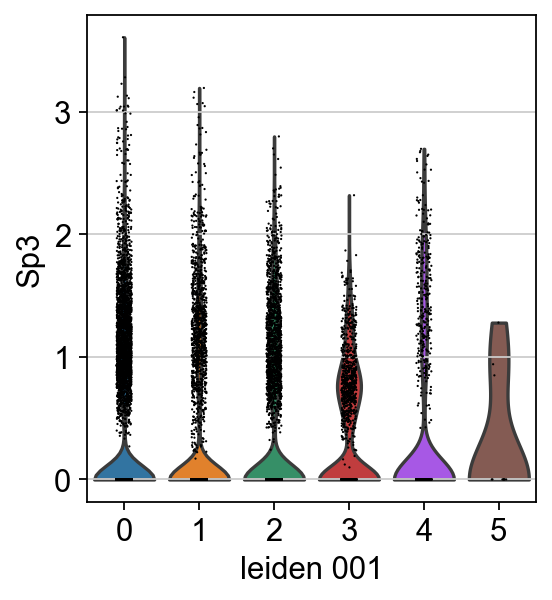

In [74]:
sc.pl.violin(adata,['Sp3'], groupby='leiden_001')

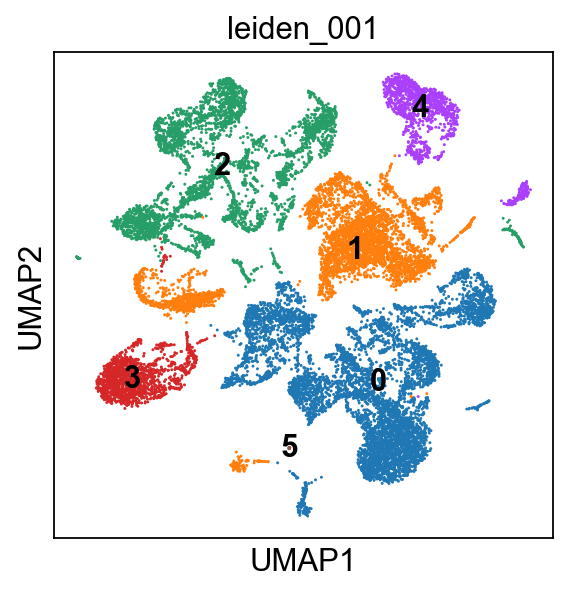

In [75]:
sc.pl.umap(adata,color='leiden_001',legend_loc='on data')

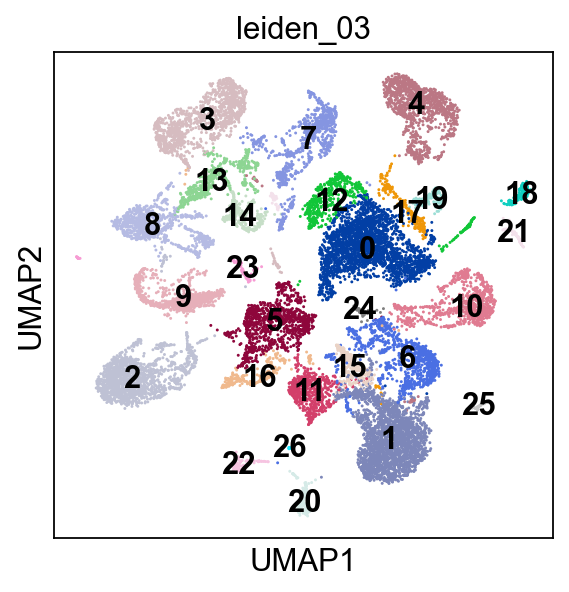

In [76]:
sc.pl.umap(adata,color='leiden_03',legend_loc='on data')

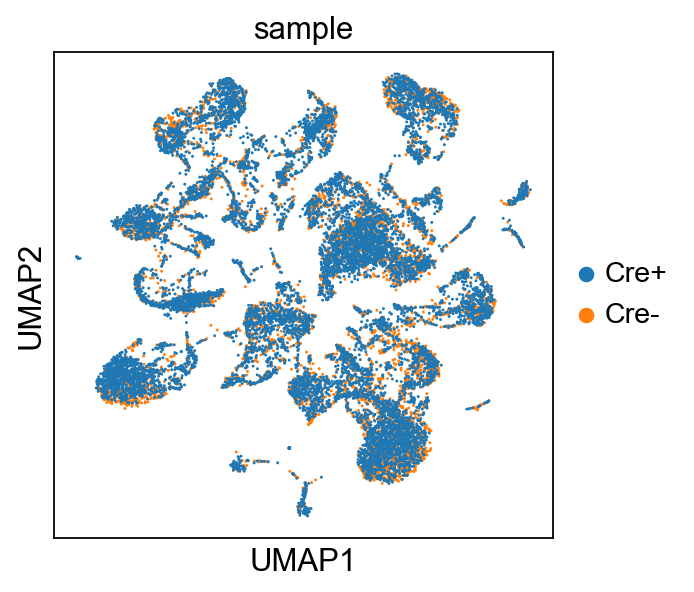

In [77]:
sc.pl.umap(adata, color='sample')

In [78]:
#macrophages : 3, 9, 13, 14, 22

In [79]:
adata_sub = adata[adata.obs.leiden_03.isin(['3', '9', '13', '14', '22'])]
#subsetting the clusters represented by macrophages

In [80]:
adata_sub = adata[adata.obs.celltype.isin(['T-cell'])]

AttributeError: 'DataFrame' object has no attribute 'celltype'

In [81]:
sc.pl.violin(adata_sub,['Sp3'], groupby='celltype')

KeyError: "Could not find keys '['celltype']' in columns of `adata.obs` or in adata.raw.var_names."

In [ ]:
adata_sub.obs

In [ ]:
axs = sc.pl.rank_genes_groups_stacked_violin(adata, n_genes=50, groups=['Macrophages'],groupby = 'sample')

In [ ]:
sc.pl.violin(adata_sub,['Sp3'], groupby='sample')
#Sp3 expression in macrophages clusters

In [ ]:
sc.pl.violin(adata_sub,['Sp3'], groupby='leiden_03')
#Sp3 expression in each of the macrophage clusters

In [ ]:
sc.pl.umap(adata_sub,color = 'Sp3')

In [ ]:
sc.pl.umap(adata_sub,color = 'leiden_03')

In [ ]:
sc.tl.umap(adata_sub)

In [ ]:
sc.pl.umap(adata_sub)

In [ ]:
print(adata.obs['sample'].value_counts())

In [ ]:
print(adata_sub.obs['sample'].value_counts())

In [ ]:
sc.pl.umap(adata_sub[1:907], color='Sp3')
#Sp3 expression in Cre- samples

In [ ]:
sc.pl.umap(adata_sub[907:907+1861], color='Sp3')
#Sp3 expression in Cre+ samples

In [ ]:
chk = adata_sub[1:907].obs

In [ ]:
print(chk['sample'].value_counts())
#verifying the previous plots are made of Cre- and Cre+ samples.The next 2 steps also do the same.

In [ ]:
chk = adata_sub[907:907+1861].obs

In [ ]:
print(chk['sample'].value_counts())

In [ ]:
sc.pl.umap(adata_sub[1:1861], color='Sp3')

In [ ]:
sc.tl.dendrogram(adata_sub,groupby = 'sample')

In [ ]:
sc.pl.umap(adata_sub[1:907], color='leiden_03',frameon=False, legend_fontsize=4, legend_fontoutline=2)
#Umap based on leiden clustering of Cre- samples

In [ ]:
sc.pl.umap(adata_sub[907:907+1861], color='leiden_03',frameon=False, legend_fontsize=4, legend_fontoutline=2)
#Umap based on leiden clustering of Cre+ samples

In [ ]:
#adata_sub.obs['cell type_v2'] = 'Macrophages'

In [ ]:
sc.pl.rank_genes_groups_dotplot(adata_sub, n_genes=100, groups=['Macrophages'],groupby = 'sample')

In [ ]:
sc.pl.rank_genes_groups_stacked_violin(adata_sub, n_genes=100, groups=['Macrophages'],groupby = 'sample')

In [ ]:
sc.pl.rank_genes_groups_matrixplot(adata_sub, n_genes=100, groups=['Macrophages'],groupby = 'sample',standard_scale='var', cmap='Blues')

In [ ]:
sc.pl.rank_genes_groups_matrixplot(adata_sub, n_genes=100, groups=['Macrophages'],groupby = 'leiden_03',standard_scale='var', cmap='Blues')

In [ ]:
sc.tl.rank_genes_groups(adata_sub, groupby='leiden_03', method='wilcoxon')

In [ ]:
sc.pl.rank_genes_groups(adata_sub, groupby='leiden_03', method='wilcoxon')

In [ ]:
sc.pl.rank_genes_groups_matrixplot(adata_sub, n_genes=40, groups=['22'],groupby = 'sample',standard_scale='var', cmap='Blues')

In [ ]:
sc.pl.rank_genes_groups_matrixplot(adata_sub, n_genes=40, groups=['3'],groupby = 'sample',standard_scale='var', cmap='Blues')

In [ ]:
sc.pl.rank_genes_groups_matrixplot(adata_sub, n_genes=40, groups=['9'],groupby = 'sample',standard_scale='var', cmap='Blues')

In [ ]:
sc.pl.umap(adata_sub,color = 'leiden_03')

In [ ]:
sc.pl.rank_genes_groups_matrixplot(adata_sub, n_genes=40, groups=['14'],groupby = 'sample',standard_scale='var', cmap='Blues')

In [ ]:
scv.set_figure_params()

In [ ]:
#Computing RNA velocity for macrophage clusters
scv.pl.proportions(adata_sub)

In [ ]:
scv.pp.filter_genes(adata_sub, min_shared_counts=20)
scv.pp.normalize_per_cell(adata_sub)
scv.pp.filter_genes_dispersion(adata_sub, n_top_genes=2000)
scv.pp.log1p(adata_sub)

In [ ]:
scv.pp.filter_and_normalize(adata_sub, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata_sub, n_pcs=30, n_neighbors=30)

In [ ]:
scv.tl.velocity(adata_sub)

In [ ]:
scv.tl.velocity_graph(adata_sub)

In [ ]:
scv.pl.velocity_embedding_stream(adata_sub, basis='umap',color = 'leiden_03')

In [ ]:
scv.pl.velocity_embedding(adata_sub, arrow_length=3, arrow_size=2, dpi=120,color = 'leiden_03')

In [ ]:
scv.tl.score_genes_cell_cycle(adata_sub)
scv.pl.scatter(adata_sub, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95])

In [ ]:
scv.tl.velocity_confidence(adata_sub)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata_sub, c=keys, cmap='coolwarm', perc=[5, 95])

In [ ]:
scv.pl.velocity_graph(adata_sub, threshold=.1,color = 'leiden_03')

In [ ]:
x, y = scv.utils.get_cell_transitions(adata_sub, basis='umap', starting_cell=70)
ax = scv.pl.velocity_graph(adata_sub, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata_sub, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

In [ ]:
scv.tl.velocity_pseudotime(adata_sub)
scv.pl.scatter(adata_sub, color='velocity_pseudotime', cmap='gnuplot')

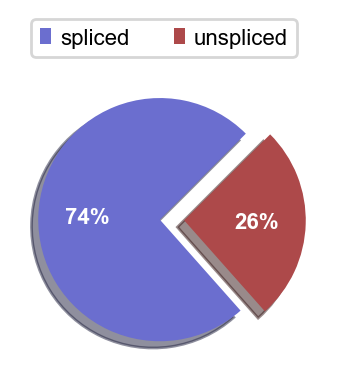

In [82]:
scv.pl.proportions(adata)

In [83]:
scv.pp.filter_genes(adata, min_shared_counts=20)
scv.pp.normalize_per_cell(adata)
scv.pp.filter_genes_dispersion(adata, n_top_genes=2000)
scv.pp.log1p(adata)

Filtered out 622 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Extracted 2000 highly variable genes.


In [84]:
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

Filtered out 122 genes that are detected 20 counts (shared).
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
computing neighbors
    finished (0:00:01) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [85]:
scv.tl.velocity(adata)

computing velocities
    finished (0:00:08) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [86]:
scv.tl.velocity_graph(adata)

computing velocity graph (using 1/8 cores)


  0%|          | 0/17157 [00:00<?, ?cells/s]

    finished (0:01:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:02) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


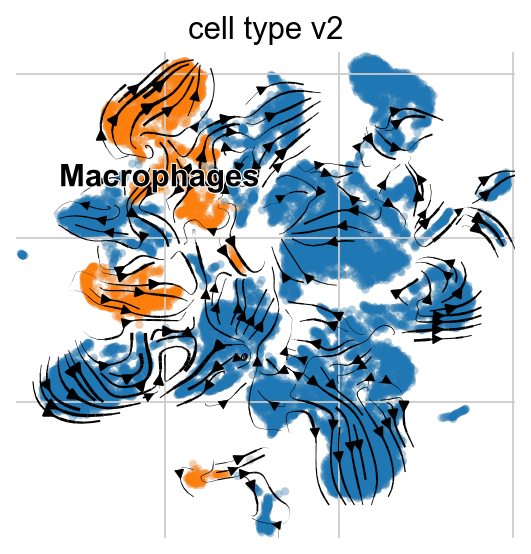

In [87]:
scv.pl.velocity_embedding_stream(adata, basis='umap',color = 'cell type_v2')

In [88]:
import pandas as pd

In [89]:
df = pd.read_csv('Edited_PanglaoDB.csv')
#Reading edited PanglaoDB(https://academic.oup.com/database/article/doi/10.1093/database/baz046/5427041)

In [90]:
df['official.gene.symbol'] = df['official.gene.symbol'].str.lower()
df['official.gene.symbol'] = df['official.gene.symbol'].str.capitalize()


In [91]:
monocytes = df.loc[df['cell.type'] == 'Monocytes']

In [92]:
alveolar_macrophages = df.loc[df['cell.type'] == 'Alveolar macrophages']

In [93]:
dendritic_cells = df.loc[df['cell.type'] == 'Dendritic cells']

In [94]:

monocytes_markers = list(monocytes['official.gene.symbol'])

In [95]:
dendritic_cell_markers = list(dendritic_cells['official.gene.symbol'])

In [96]:
alveolar_macrophages_markers = list(alveolar_macrophages['official.gene.symbol'])

In [97]:
monocytes_markers = list(monocytes['official.gene.symbol'])

In [98]:
#common_list = set(list_one).intersection(list_two)

In [99]:
s = pd.DataFrame(adata.var)

In [100]:
s.index.name = 'gene_name'
s.reset_index(inplace=True)

In [101]:
s['gene_name'] = s['gene_name'].str.lower()
dataset_genes = list(s['gene_name'].str.capitalize())



In [102]:
def intersection(lst1, lst2):
    lst3 = [value for value in lst1 if value in lst2]
    return lst3
#Finding monocyte markers,alveolar macrophages,dendritic cells 
mono_common_list = intersection(monocytes_markers,dataset_genes)
dendr_common_list = intersection(dendritic_cell_markers,dataset_genes)
alveo_common_list = intersection(alveolar_macrophages_markers,dataset_genes)

#three genes in dendritic list is giving issues in the code;if we really really need them,I can include them in. 
elements = ['H2-ab1', 'H2-dma', 'H2-eb1']
dendr_common_list1 = list(set(dendr_common_list) - set(elements))


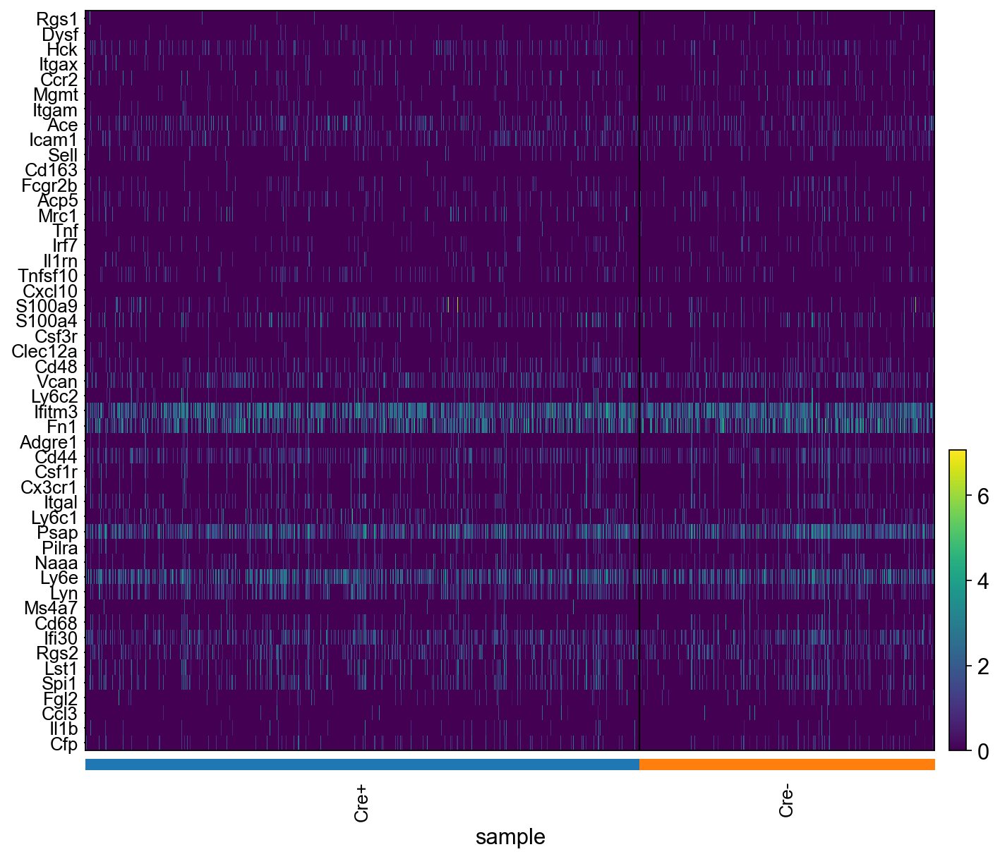

In [103]:
sc.pl.heatmap(adata,mono_common_list,groupby='sample',swap_axes=True)

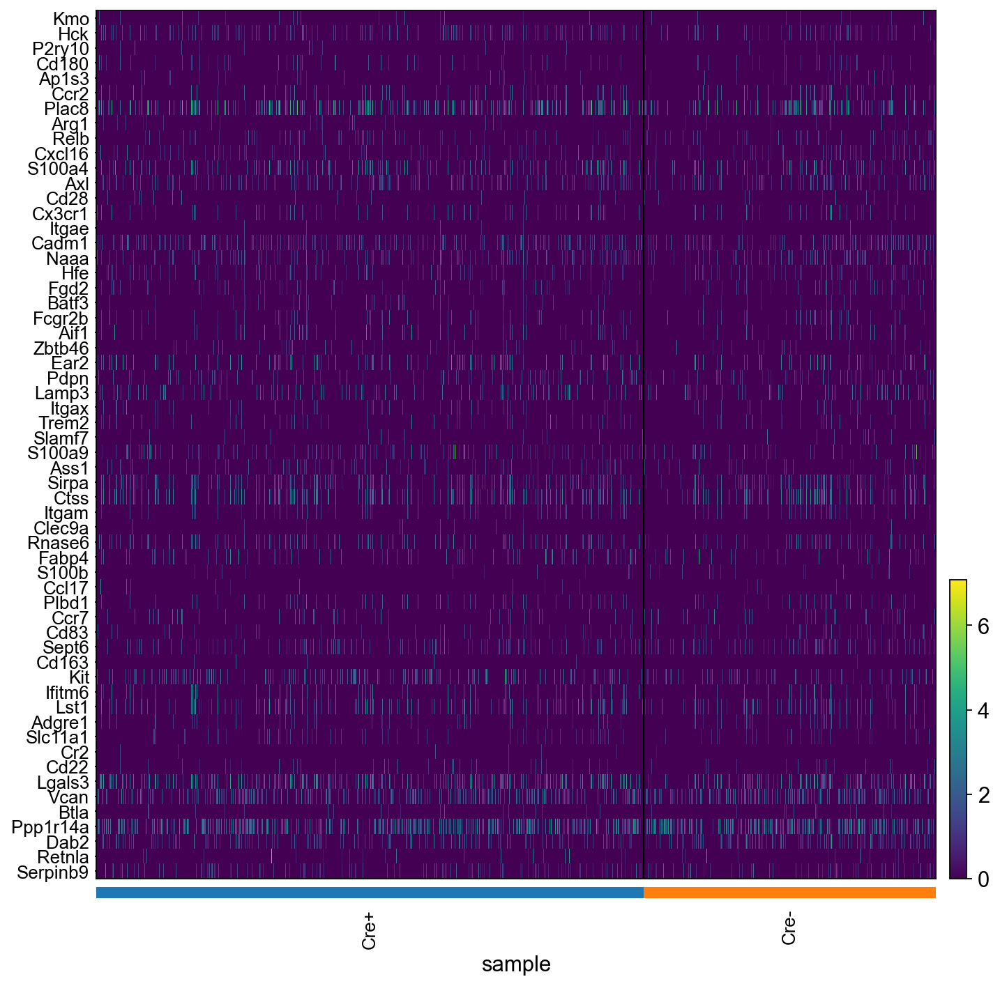

In [104]:
sc.pl.heatmap(adata,dendr_common_list1,groupby='sample',show_gene_labels=True,swap_axes=True)

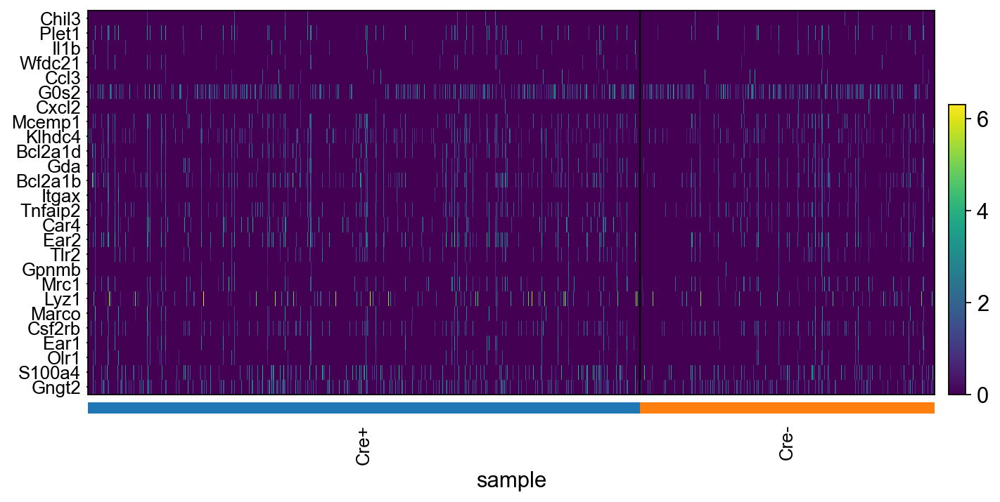

In [105]:
sc.pl.heatmap(adata,alveo_common_list,groupby='sample',swap_axes=True)

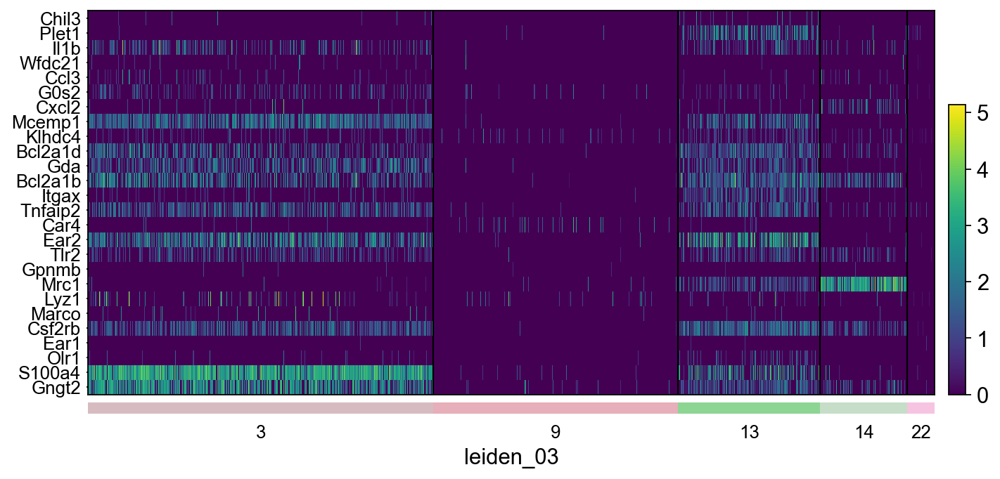

In [106]:
sc.pl.heatmap(adata_sub,alveo_common_list,groupby='leiden_03',swap_axes=True)

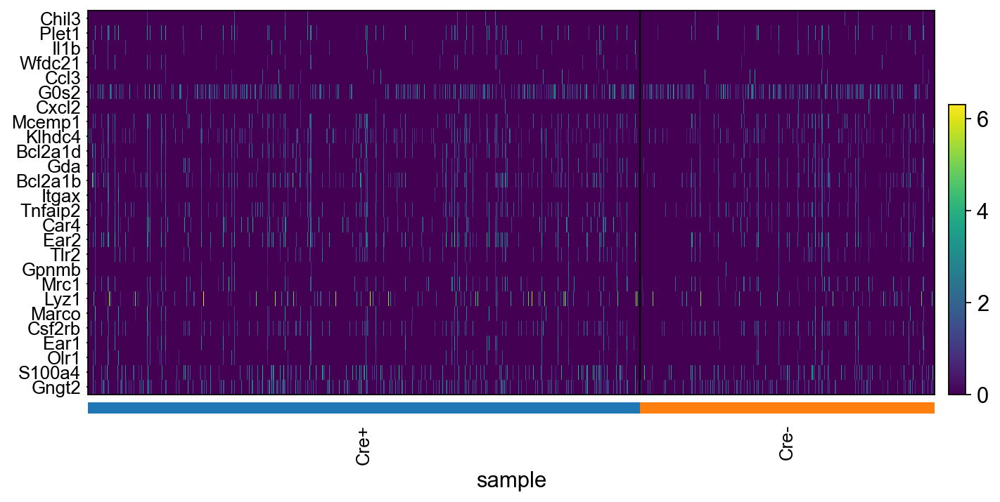

In [107]:
sc.pl.heatmap(adata,alveo_common_list,groupby='sample',swap_axes=True)

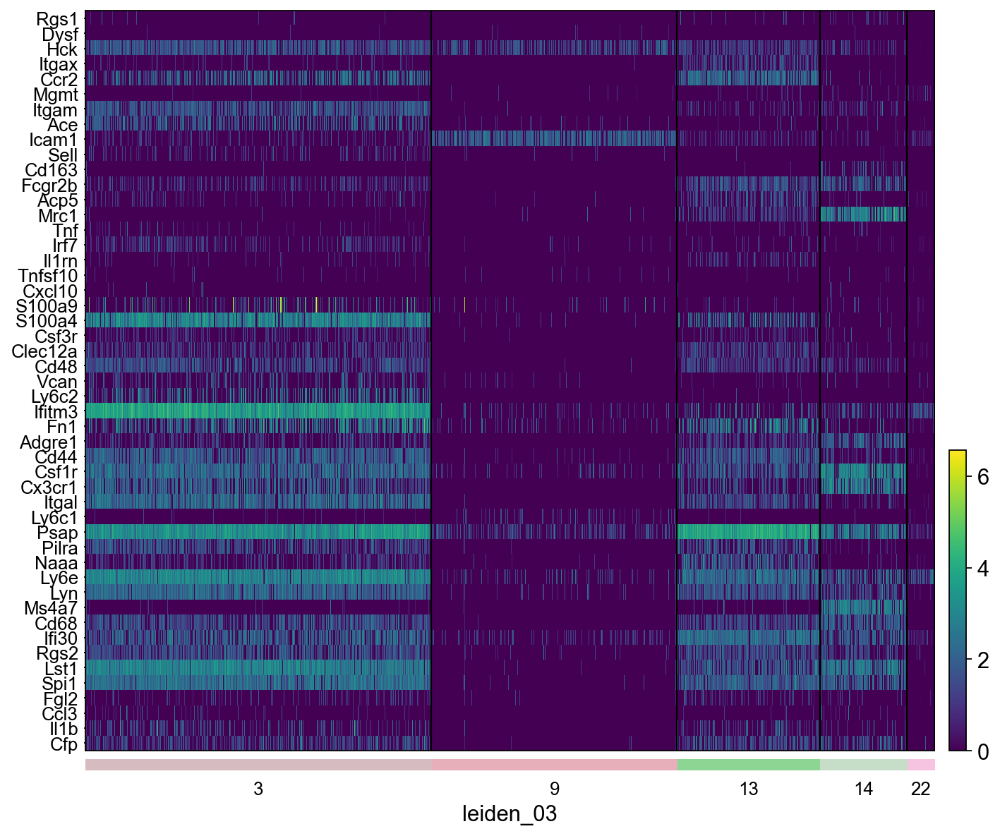

In [108]:
sc.pl.heatmap(adata_sub,mono_common_list,groupby='leiden_03',swap_axes=True)

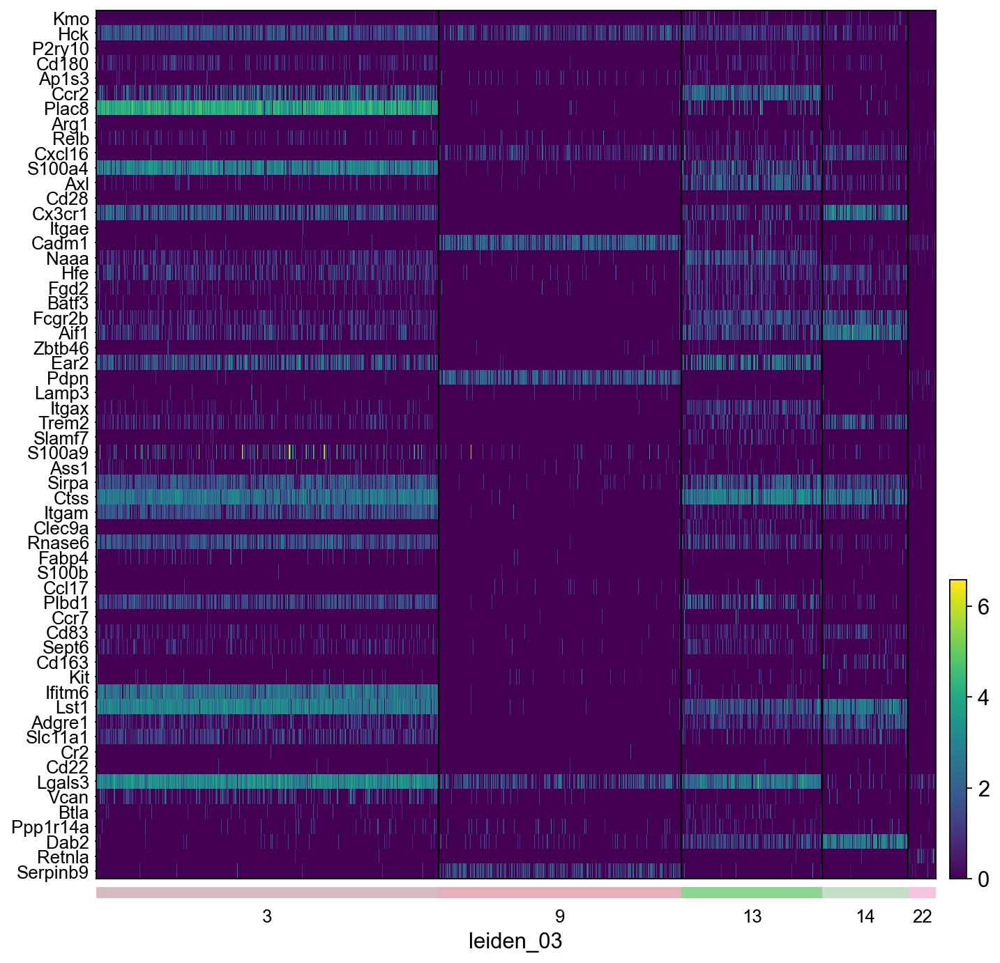

In [109]:
sc.pl.heatmap(adata_sub,dendr_common_list1,groupby='leiden_03',show_gene_labels=True,swap_axes=True)

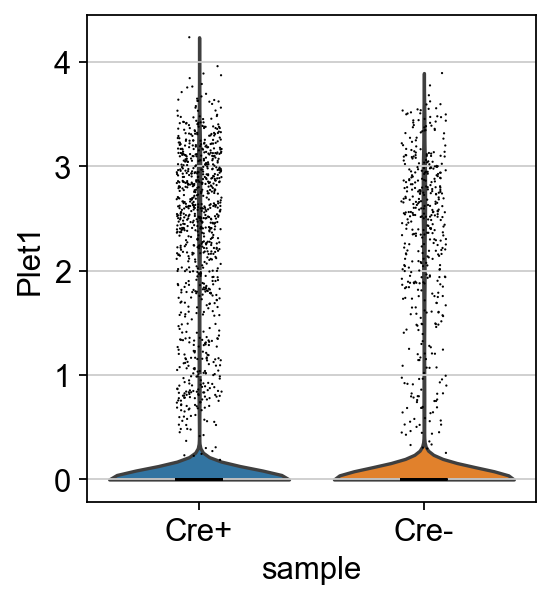

In [110]:
sc.pl.violin(adata,['Plet1'], groupby='sample')

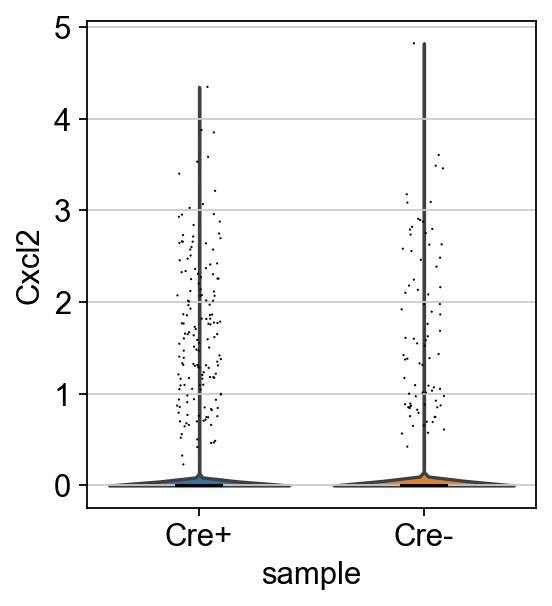

In [111]:
sc.pl.violin(adata,['Cxcl2'], groupby='sample')

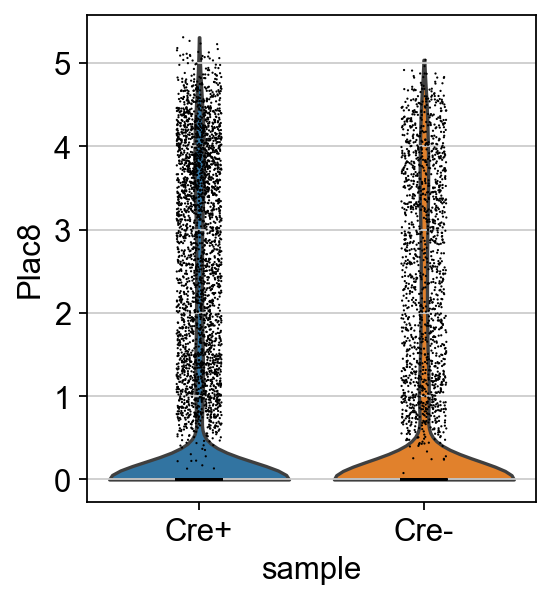

In [112]:
sc.pl.violin(adata,['Plac8'], groupby='sample')

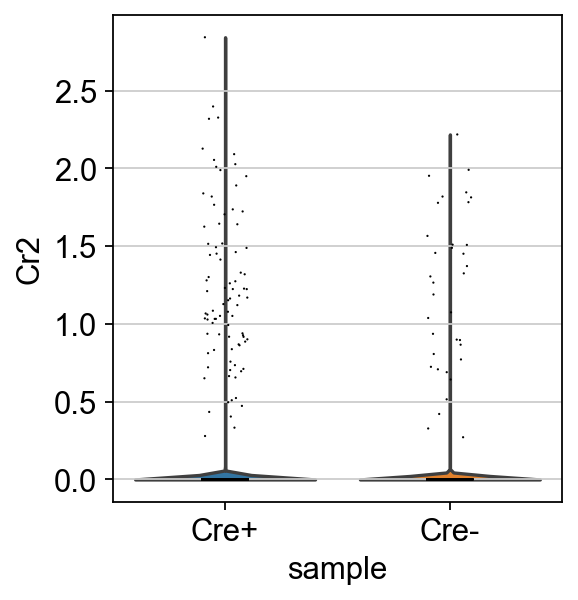

In [113]:
sc.pl.violin(adata,['Cr2'], groupby='sample')

In [114]:
sc.tl.rank_genes_groups(adata_sub,'sample', groups=['Cre+'], reference='Cre-', method='wilcoxon')
sc.pl.rank_genes_groups(adata_sub, groups=['Cre+'], n_genes=50)

ranking genes


ValueError: Value passed for key 'PCs' is of incorrect shape. Values of varm must match dimensions (1,) of parent. Value had shape (2789, 50) while it should have had (1878,).

In [ ]:
sc.pl.violin(adata_sub,['Cd9'], groupby='sample')

In [ ]:
sc.pl.violin(adata,['S100a4'], groupby='sample')

In [ ]:
sc.pl.violin(adata,['Cd63'], groupby='sample')

In [ ]:
sc.pl.violin(adata_sub,['Calm1'], groupby='sample')

In [ ]:
sc.pl.violin(adata_sub,['Nfkb1'], groupby='sample')

In [ ]:
sc.pl.violin(adata_sub,['Ikbkb'], groupby='sample')

In [ ]:
sc.pl.rank_genes_groups(adata_sub,groupby='sample', method='wilcoxon',n_genes=50)

In [ ]:
sc.pl.rank_genes_groups_matrixplot(adata_sub, n_genes=40,groupby = 'sample',standard_scale='var', cmap='Blues')

In [ ]:
sc.pl.dotplot(adata_sub,['Calm1','Cox4i1','Cox7c','Scand1','Smdt1','Txn1','Tyrobp','H2-D1'],groupby='sample')

In [ ]:
sc.pl.dotplot(adata_sub,['Tyrobp','H2-D1'],groupby='sample')

In [ ]:
sc.pl.dotplot(adata_sub,['Tyrobp'],groupby='sample')

In [ ]:
sc.pl.dotplot(adata_sub,['H2-D1'],groupby='sample')

In [ ]:
sc.pl.dotplot(adata_sub,['Arpc4'],groupby='sample')

In [ ]:
sample1 = ['Calm1','Cox4i1','Cox7c','Scand1','Smdt1','Txn1','Arpc4','Tyrobp','H2-D1','Lars2']
sc.pl.heatmap(adata_sub,sample1,groupby='sample',show_gene_labels=True)

In [ ]:
sc.pl.dotplot(adata_sub,['C1qa'],groupby='sample')

In [ ]:
sc.pl.dotplot(adata_sub,['Ikbkb'],groupby='sample')

In [ ]:
sc.pl.dotplot(adata_sub,['Sp3'],groupby='sample')

In [ ]:
sc.pl.dotplot(adata_sub,['Sp2'],groupby='sample')

In [ ]:
result = adata_sub.uns['rank_genes_groups']
groups = result['names'].dtype.names
s = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj','logfoldchanges']})

In [ ]:
adata_sub

In [ ]:
s

In [ ]:
sc.pl.rank_genes_groups(adata_sub, n_genes=20)

In [ ]:
s['log10_value'] = np.log10(s['Cre+_p'])*(-1)
print(s)


In [ ]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px

In [ ]:
s['minus_log10_pvalue'] = -np.log10(s['Cre+_p'])
s['logFC'] = s['Cre+_l']

In [ ]:
s1 = s.loc[(s['logFC'] > -10) & (s['logFC'] < 10)]

In [ ]:
s2 = s1.loc[(s['minus_log10_pvalue'] > 0)]

In [ ]:
s1 = s2

In [ ]:
fig = go.Figure()
trace1 = go.Scatter(x=s1['logFC'],y=s1['minus_log10_pvalue'],mode='markers',hovertext=s1['Cre+_n'],text=s1['Cre+_n'])
fig.add_trace(trace1)

In [ ]:
s1.to_csv('DEG_cutoff_macrophageclusters_.csv')

In [ ]:
#Checking all DE genes 

result1 = adata.uns['rank_genes_groups']
groups = result1['names'].dtype.names
s12 = pd.DataFrame(
    {group + '_' + key[:1]: result1[key][group]
    for group in groups for key in ['names', 'pvals_adj','logfoldchanges']})

In [ ]:
s12 

In [ ]:
groups

In [ ]:
s

In [ ]:
s.to_csv('DEG_cutoff_macrophageclusters_full_for_combine_jupyternotebook.csv')